# Models de regressió bayesians

Una introducció a la llibreria Bambi com a eina per a modelar amb agilitat utilitzant models de regressió, models de regressió generalitzats o fins i tot alguns models additius generalitzats (per exemple splines o processos gaussians).

**Ponent:** Oriol Abril
**Lloc:** PyDay BCN 2025, Canòdrom Barcelona

## Preparació de llibreries i dades sintètiques

Per als primer exemples farem servir dades sintètiques. Això ens permetrà:

* Contrastar inferències amb els paràmetres reals
* Garantir models amb bon comportament i ràpids d'ajustar

Un cop introduïda la llibreria passarem a dades reals. Al repositori hi ha dades de lloguers de Berlin de fa uns anys, però si voleu fer servir un altre dataset. El dataset dels pinguins disponible a través de la llibreria [palmerpenguins](https://github.com/mcnakhaee/palmerpenguins) també serveix pels nostres propòsits, així mateix, també es possible fer servir dades tabulars vostres a les que us interessi fer un ajust de regressió i que combinin columnes contínues i discretes/categòriques.

In [1]:
import arviz as az
import arviz.preview as azp
import bambi as bmb
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import xarray as xr

SEED = 2611
az.style.use("arviz-doc")

print(bmb.__version__)

0.16.0


Generarem 1000 observacions sintètiques. Cadascuna d'elles té tres valors associats, la variable independent `x`, un indicador categoric de grup `group` i la variable dependent `y` el valor de la qual depèn de `x` i del grup.

In [2]:
n = 1000
n_groups = 20
rng = np.random.default_rng(SEED)
# add 4 groups with less observations
p = np.array([1, 1, 1, 1] + [5]*(n_groups - 4), dtype=float)
groups = rng.choice(range(n_groups), size=n, p=p/p.sum())
intercepts = rng.normal(2, size=n_groups)
slopes = rng.gamma(2, 3, size=n_groups) / 3 + 0.2
x = rng.gamma(7, 3, size=n) / 5
synth_df = pd.DataFrame(
    {
        "x": x,
        "y": rng.normal(loc=intercepts[groups] + slopes[groups] * x, scale=1.3),
        "group": groups,
    }
)

La dependència entre `x` i `y` depèn del grup al qual pertany cada observació, tanmateix, hi ha certes similituds entre les dependències de cada grup. A més, fins i tot ignorant el grup de cada observació es continua apreciant una relació entre `x` i `y` (si bé amb molta incertesa al voltant d'aquesta)

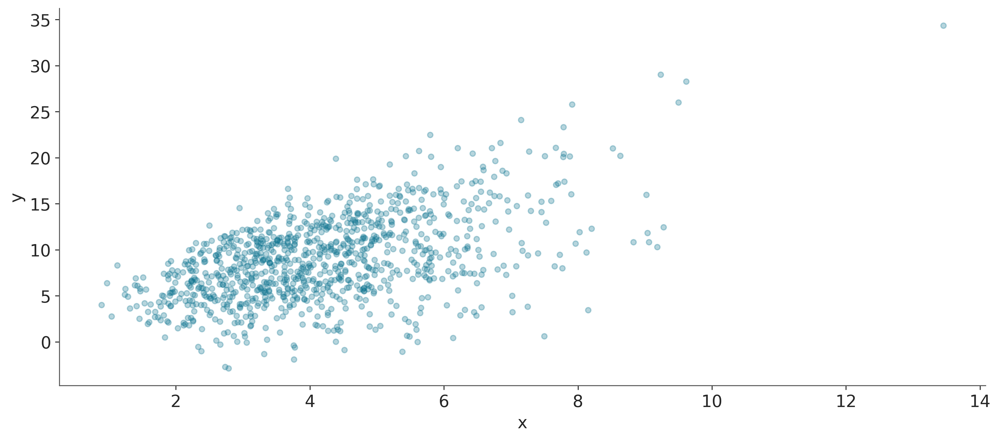

In [3]:
synth_df.plot.scatter(x="x", y="y", alpha=0.3);

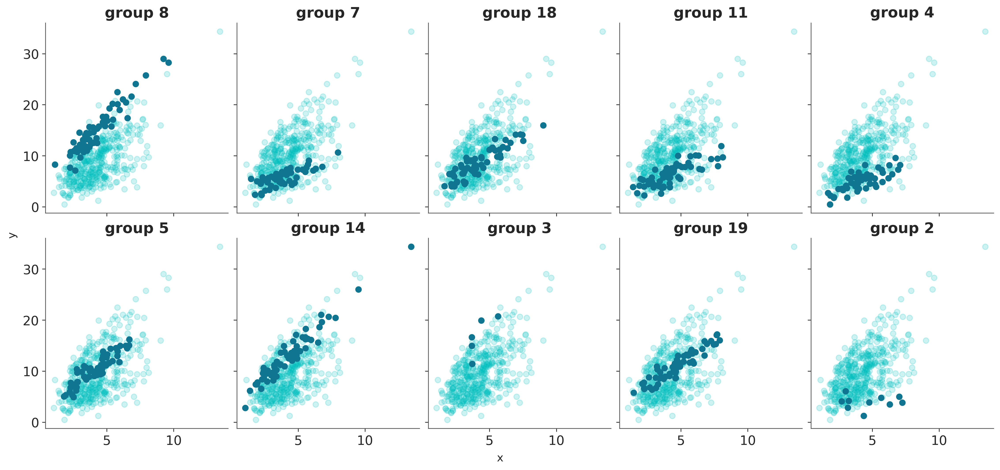

In [4]:
df = synth_df
response_var = "y"
independent_var = "x"
category_var = "group"

rng = np.random.default_rng(SEED)
random_categories = rng.choice(df[category_var].unique(), 10, replace=False)

fig, axes = plt.subplots(2, 5, figsize=(15, 7), sharex=True, sharey=True, layout="constrained")

for i, (ax, cat_id) in enumerate(zip(axes.ravel(), random_categories)):
    data_others = df.query(f"{category_var} in @random_categories")
    ax.scatter(data_others[independent_var], data_others[response_var], color="C1", alpha=0.2)
    data = df.query(f"{category_var} == @cat_id")
    ax.scatter(data[independent_var], data[response_var], color="C0")
    ax.set_title(f"{category_var} {cat_id}")

fig.supxlabel(independent_var)
fig.supylabel(response_var);

## Regressió lineal simple

### Definició del model

Per començar, fem servir un model on el paràmetres que regulen la dependència entre `x` i `y` són els mateixos per a totes les observacions. Per tal de definir el model fem servir [Bambi](https://bambinos.github.io/bambi/) una llibreria construida sobre [PyMC](https://www.pymc.io/welcome.html) que simplifica enormement treballar amb models de regressió utilitzant PyMC.

In [5]:
model_formula = f"y ~ x"
simple_model = bmb.Model(model_formula, df)
simple_model

       Formula: y ~ x
        Family: gaussian
          Link: mu = identity
  Observations: 1000
        Priors: 
    target = mu
        Common-level effects
            Intercept ~ Normal(mu: 8.9294, sigma: 33.2456)
            x ~ Normal(mu: 0.0, sigma: 7.4259)
        
        Auxiliary parameters
            sigma ~ HalfStudentT(nu: 4.0, sigma: 4.6414)

Un cop definit el model de Bambi amb la fórmula inicial, podem revisar els detalls del model generat. Aquests són els elements principals dels models de regressió generalitzats (GLM per les sigles en anglès, _generalized linear models_) que es poden construir amb Bambi:

* `Formula`: la fórmula inicial definint la relació entre variables independents i dependents. Més endavant en aquest mateix tutorial veurem altres fórmules per a definir models jerarquics i controlar-ne la seva parametrització, també en teniu més detalls a la [documentació de Bambi](https://bambinos.github.io/bambi/notebooks/getting_started.html#formula-based-specification)
* `Family` i `Link`: la família i la funció d'enllaç del GLM defineixen la distribució observacional. Les diferents famílies permeten modelar dades que segueixen distribucions diferents, fins i tot observacions discretes sense haver de fer cap canvi en la fórmula ni en la majoria d'altres elements del model. La [documentació de Bambi](https://bambinos.github.io/bambi/notebooks/getting_started.html#families) inclou una taula amb les famílies disponibles i exemples d'us.
* `Observations`: Indicador del nombre d'observacions incloses en el model. Bambi no permet que hi hagi valors `NaN` ni en les variables dependents ni independents, de manera que aquest número no té perquè ser el nombre de files del DataFrame d'entrada.
* `Priors`: Aquesta secció serveix tan per tenir una idea dels paràmetres del model com dels priors que s'han assignat a cadascun d'ells. Definir prior es un pas imprescindible a l'hora de fer models Bayesians, però Bambi té rutines internes per definir priors per defecte i facilitar l'inici del procés de modelització. Al final d'aquest tutorial hi ha un exemple de modificació d'un prior, i evidentment, a la [documentació de Bambi](https://bambinos.github.io/bambi/notebooks/getting_started.html#specifying-priors) també n'hi ha múltiples exemples.

També podem aprofitar les funcionalitats de PyMC per obtenir un diagrama de les interdependències entre els paràmetres del model:

ERROR (pytensor.graph.rewriting.basic): Rewrite failure due to: random_make_inplace
ERROR (pytensor.graph.rewriting.basic): node: t_rv{"(),(),()->()"}(*0-<RandomGeneratorType>, *1-<NoneTypeT>, *2-<Scalar(float64, shape=())>, 0.0, *3-<Scalar(float64, shape=())>)
ERROR (pytensor.graph.rewriting.basic): TRACEBACK:
ERROR (pytensor.graph.rewriting.basic): Traceback (most recent call last):
  File "/home/oriol/bin/miniforge3/envs/pyday-bambi/lib/python3.13/site-packages/pytensor/graph/rewriting/basic.py", line 1920, in process_node
    replacements = node_rewriter.transform(
        fgraph, node, enforce_tracks=enforce_tracks
    )
  File "/home/oriol/bin/miniforge3/envs/pyday-bambi/lib/python3.13/site-packages/pytensor/graph/rewriting/basic.py", line 993, in transform
    return self.fn(fgraph, node)
           ~~~~~~~^^^^^^^^^^^^^^
  File "/home/oriol/bin/miniforge3/envs/pyday-bambi/lib/python3.13/site-packages/pytensor/tensor/random/rewriting/basic.py", line 54, in random_make_inplace
   

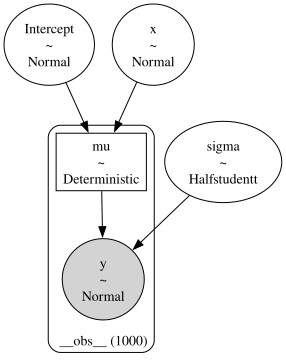

In [6]:
simple_model.build()
simple_model.backend.model.to_graphviz()

### Anàlisi de distribucions a priori

En general és recomanable revisar les distribucions a priori dels paràmetres del model per assegurar-nos de dues coses. Primerament cal comprovar que els priors no prohibeixen al model explorar cap regió de l'espai dels paràmetres que considerem possible (per molt que sigui remotament). També sol ser una bona idea comprovar que en cas de tenir algun coneixement sobre els paràmetres degut al model o la seva estructura que els _priors_ incloguin aquesta informació.

Podem obtenir mostres dels _priors_ amb el mètode `.prior_predictive` del model de Bambi i després fer-ne un gràfic amb [ArviZ](https://python.arviz.org/en/stable/) per anàlitzar els resultats més fàcilment.

In [7]:
simple_idata = simple_model.prior_predictive(draws=2000)

Sampling: [Intercept, sigma, x, y]


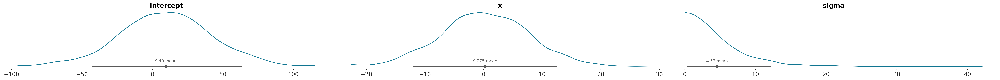

In [8]:
azp.plot_dist(simple_idata, group="prior", var_names="~mu");

En aquest cas, els priors per a la ordenada a l'origen i el pendent són distribucions gaussianes que tenen com a domini tots els nombres reals fet que reflecteix el fet que no tenim cap informació sobre aquests dos paràmetres. Per altra banda, el prior per a sigma és una distribució seminormal. En aquest cas, al ser un paràmetre de la variança volem precisament que els únics valors possibles siguin positius.

### Inferència
Per tal d'ajustar el model fem servir el mètoda `.fit()`. A més a més, en aquesta mateixa cel·la també generem altres quantitats d'interès, que ens ajudaran a generar múltiples diagnostics i crítiques del model.

In [9]:
simple_idata = simple_model.prior_predictive(draws=2000)
simple_idata.extend(simple_model.fit(idata_kwargs={"log_likelihood": True, "log_prior": True}))
simple_model.predict(simple_idata, kind="response")
simple_idata["constant_data"] = xr.Dataset({"x": (["__obs__"], x)}, coords={"__obs__": simple_idata.posterior["__obs__"]})

# add group information to data
simple_idata_extra_idx = simple_idata.map(lambda ds: ds.assign_coords(group=(["__obs__"], groups)).set_xindex("group"))

Sampling: [Intercept, sigma, x, y]
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [sigma, Intercept, x]


Output()

Sampling 4 chains for 1_000 tune and 1_000 draw iterations (4_000 + 4_000 draws total) took 1 seconds.


El resultat de la inferència es una estructura jerarquica que segueix [l'esquema InferenceData](https://python.arviz.org/en/stable/schema/schema.html) i que conté la informació de les distribucions a priori, de la distribució a posteriori ajustada i fins i tot de les prediccions generades pel model.

In [10]:
simple_idata

Inference data with groups:
	> posterior
	> posterior_predictive
	> log_likelihood
	> log_prior
	> sample_stats
	> prior
	> prior_predictive
	> observed_data
	> constant_data

### Diagnòstics sobre la inferència
L'ajust del model s'ha fet amb un mètode de Markov Chain Monte Carlo (MCMC), en concret l'algoritme _NUTS_ (_no u-turn sampler_, mostreig sense girs en rodó en anglès). Els MCMC són una família d'algoritmes molt flexible i poderosa, però són un mètode per generar mostres aproximades d'una distribució arbitrària, en el nostre cas la distribució a posteriori. Per tant hem de comprovar la convergència del MCMC un cop ha acabat l'ajust.

La única manera de tenir una garantia sobre la convergència d'un algoritme MCMC és en aconseguir generar un nombre infinit de mostres, no podrem tenir mai una garantia de convergència. Ara bé, hi ha molts casos on a través de múltiples diagnostics si que podem assegurar que no hi ha hagut convergència i que per tant no podem utilitzar els resultats. La [documentació d'ArviZ](https://arviz-devs.github.io/EABM/Chapters/MCMC_diagnostics.html) té molts més detalls sobre com diagnosticar MCMC.

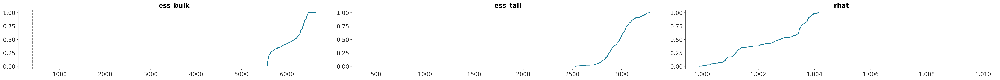

In [10]:
azp.plot_convergence_dist(simple_idata)

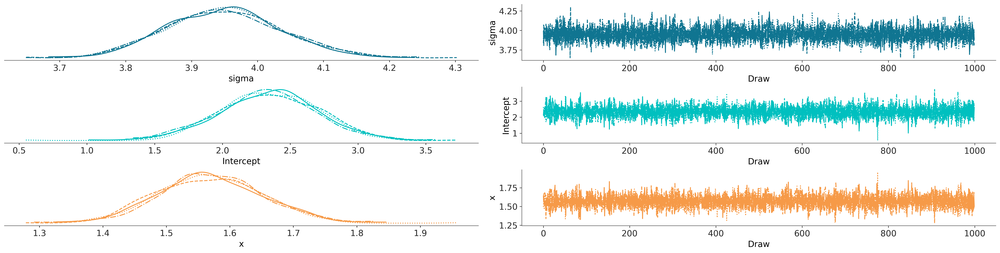

In [12]:
azp.plot_trace_dist(simple_idata, var_names="~mu");

### Sensitivitat de les distribucions a priori i observacional

Gràcies a les quantitats auxiliars `log_prior` i `log_likelihood` que hem calculat anteriorment també podem aproximar quin efecte tenen canvis en les distribucions a priori dels paràmetres o en la distribució observacional que defineix el terme de versemblança. Simularem concentrar o dispersar la densitat de probabilitat de cadascuna de les distrubucions per veure quin efecte té en els resultats. La [documentació d'ArviZ](https://arviz-devs.github.io/EABM/Chapters/Sensitivity_checks.html) té encara més detalls sobre aquest tipus de diagnostics.

In [11]:
azp.psense_summary(simple_idata, var_names="~mu")

,prior,likelihood,diagnosis
sigma,0.003,0.097,✓
Intercept,0.000,0.090,✓
x,0.000,0.098,✓


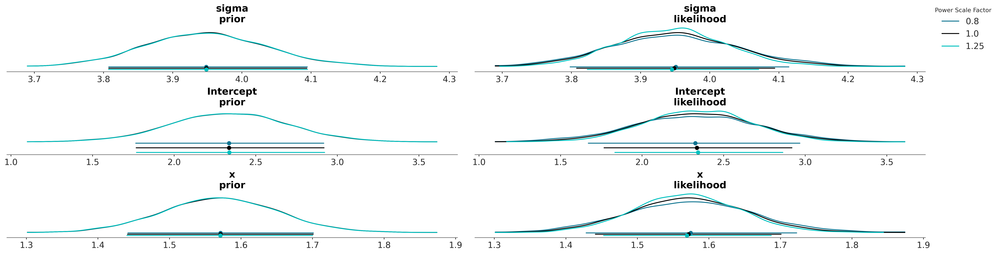

In [12]:
azp.plot_psense_dist(simple_idata, var_names="~mu");

### Critica de models

Una altra comprovació recomanable és veure si les prediccions que fa el model per a les observacions que ja tenim. En cas que el nostre model sigui compatible amb el procés de generació de dades veritable significa que no hem de ser capaços de distingir les prediccions de les dades observades.

En aquest primer gràfic sobreposem multiples distribucions predictives (en blau) amb la distribució de les observacions.

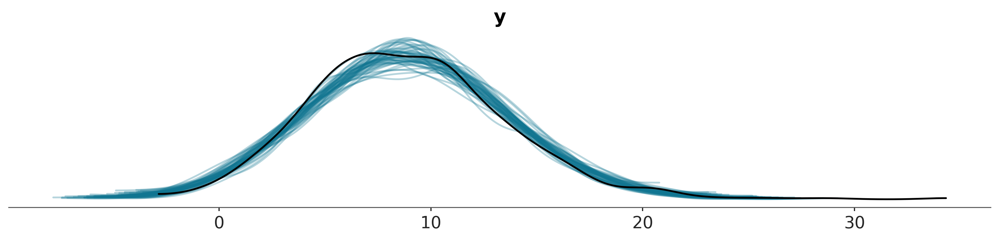

In [13]:
azp.plot_ppc_dist(simple_idata);

En aquest segon gràfic utilitzem la transformació integral de probabilitat (PIT) per comparar les distribucions predictives i la observada. En aquest cas, ens interessa que la línea sigui el màxim horitzontal possible, estant tota ella dins de l'envolvent grisa.

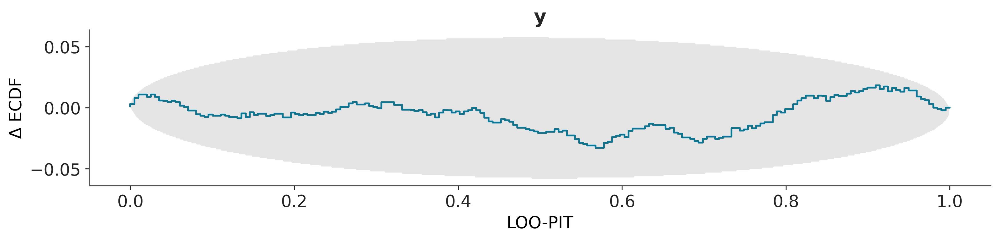

In [14]:
azp.plot_loo_pit(simple_idata);

Tal com hem comentat, el model no té en compte el grup al que pertanyen les observacions. Si repetim el primer gràfic exploratori ara que hem ajustat el model hi podem afegir la predicció mitjana i una banda del 89% de credibilitat de les prediccions en funció de `x`.

En cas que el model s'ajusti be a les dades, com que tenim 1000 observacions hauriem d'esperar tenir uns 100 punts fora de la banda, i la resta dins de la banda. I sembla ser el cas, fet que reafirma els dos diagnostics anteriors.

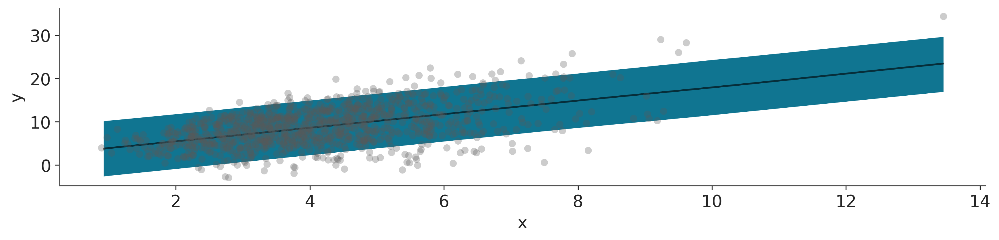

In [16]:
azp.plot_lm(simple_idata);

Ara bé, si ens mirem aquest mateix gràfic incluent dades de només un sol grup veurem que aquest model en realitat està sobre estimant la variança en les dades. Més o menys es com si intentessim predir la `y` donada una `x` sense saber-ne el seu grup, cosa que ens obliga a ser molt més conservadors. En cas que si que coneguem el grup, sembla clar que podem afinar molt millor tant el pendent de la dependència com la variança en les dades observades.

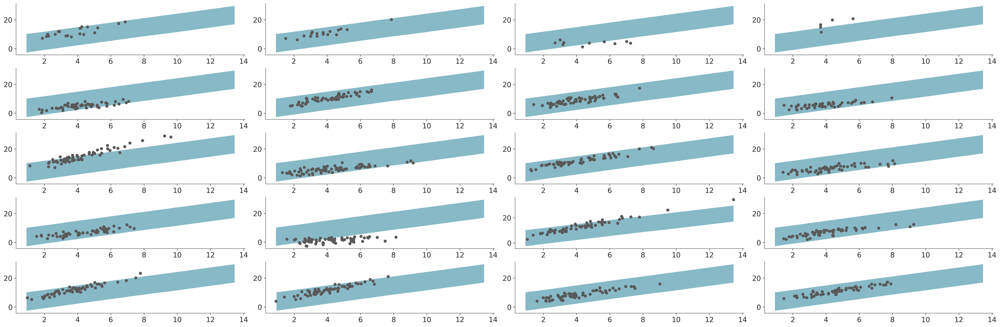

In [15]:
azp.plot_lm(
    simple_idata_extra_idx, 
    cols=["group"],
    visuals={
        "pe_line": False,
        "xlabel": False,
        "ylabel": False,
        "ci_band": {"alpha": 0.5},
        "observed_scatter": {"alpha": 1},
    },
);

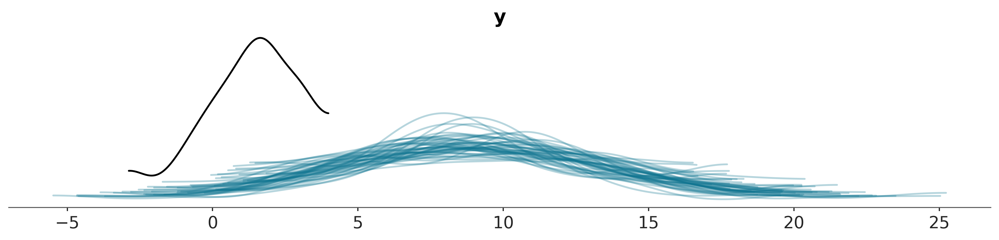

In [17]:
azp.plot_ppc_dist(simple_idata_extra_idx, coords={"group": 13});

## Regressió lineal jeràrquica

In [13]:
model_formula = f"{response_var} ~ ({independent_var}|{category_var})"
hierarchical_model = bmb.Model(model_formula, df)
hierarchical_model

       Formula: y ~ (x|group)
        Family: gaussian
          Link: mu = identity
  Observations: 1000
        Priors: 
    target = mu
        Common-level effects
            Intercept ~ Normal(mu: 8.9294, sigma: 11.6035)
        
        Group-level effects
            1|group ~ Normal(mu: 0.0, sigma: HalfNormal(sigma: 11.6035))
            x|group ~ Normal(mu: 0.0, sigma: HalfNormal(sigma: 7.4259))
        
        Auxiliary parameters
            sigma ~ HalfStudentT(nu: 4.0, sigma: 4.6414)

In [14]:
hierarchical_idata = hierarchical_model.fit(idata_kwargs={"log_likelihood": True, "log_prior": True})
hierarchical_idata.extend(hierarchical_model.prior_predictive(draws=2000))
hierarchical_model.predict(hierarchical_idata, kind="response")
hierarchical_idata["constant_data"] = xr.Dataset({"x": (["__obs__"], x)}, coords={"__obs__": hierarchical_idata.posterior["__obs__"]})

# add group information to data
hierarchical_idata_extra_idx = hierarchical_idata.map(lambda ds: ds.assign_coords(group=(["__obs__"], groups)).set_xindex("group"))

Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [sigma, Intercept, 1|group_sigma, 1|group_offset, x|group_sigma, x|group_offset]


Output()

Sampling 4 chains for 1_000 tune and 1_000 draw iterations (4_000 + 4_000 draws total) took 17 seconds.
Sampling: [1|group_offset, 1|group_sigma, Intercept, sigma, x|group_offset, x|group_sigma, y]


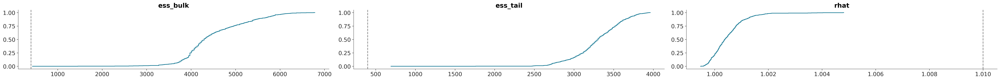

In [16]:
azp.plot_convergence_dist(hierarchical_idata);

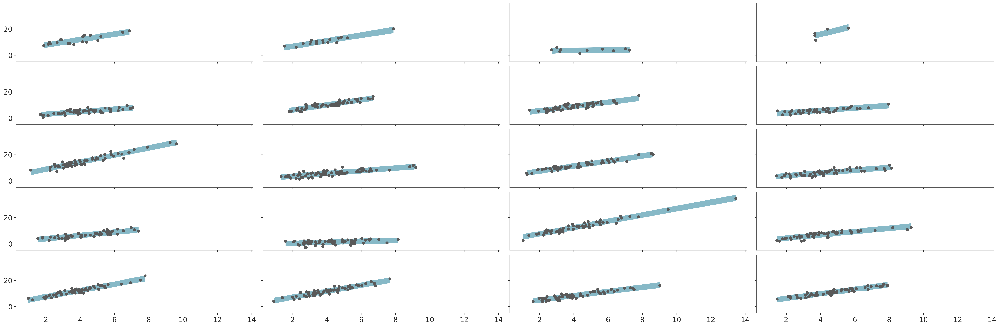

In [17]:
pc = azp.plot_lm(
    hierarchical_idata_extra_idx, 
    cols=["group"],
    visuals={
        "pe_line": False,
        "xlabel": False,
        "ylabel": False,
        "ci_band": False,
        "observed_scatter": {"alpha": 1},
    },
    figure_kwargs={"sharex": True, "sharey": True},
)
sorted_x = hierarchical_idata_extra_idx.constant_data.sortby("x")["x"]
hdi = azp.hdi(hierarchical_idata_extra_idx.posterior_predictive).sel(__obs__=sorted_x["__obs__"])
pc.map(
    azp.visuals.fill_between_y,
    x=sorted_x,
    y_bottom=hdi.sel(ci_bound="lower")["y"],
    y_top=hdi.sel(ci_bound="upper")["y"],
    alpha=0.5,
)

## No intercept

In [21]:
hierarchical_model

       Formula: y ~ (x|group)
        Family: gaussian
          Link: mu = identity
  Observations: 1000
        Priors: 
    target = mu
        Common-level effects
            Intercept ~ Normal(mu: 8.9294, sigma: 11.6035)
        
        Group-level effects
            1|group ~ Normal(mu: 0.0, sigma: HalfNormal(sigma: 11.6035))
            x|group ~ Normal(mu: 0.0, sigma: HalfNormal(sigma: 7.4259))
        
        Auxiliary parameters
            sigma ~ HalfStudentT(nu: 4.0, sigma: 4.6414)
------
* To see a plot of the priors call the .plot_priors() method.
* To see a summary or plot of the posterior pass the object returned by .fit() to az.summary() or az.plot_trace()

In [18]:
model_formula = f"{response_var} ~ 0 + ({independent_var}|{category_var})"
no_intercept_model = bmb.Model(model_formula, df)
no_intercept_model

       Formula: y ~ 0 + (x|group)
        Family: gaussian
          Link: mu = identity
  Observations: 1000
        Priors: 
    target = mu
        Group-level effects
            1|group ~ Normal(mu: 0.0, sigma: HalfNormal(sigma: 11.6035))
            x|group ~ Normal(mu: 0.0, sigma: HalfNormal(sigma: 7.4259))
        
        Auxiliary parameters
            sigma ~ HalfStudentT(nu: 4.0, sigma: 4.6414)

In [19]:
no_intercept_idata = no_intercept_model.fit(idata_kwargs={"log_likelihood": True, "log_prior": True}, target_accept=0.95)
no_intercept_idata.extend(no_intercept_model.prior_predictive(draws=2000))
no_intercept_model.predict(no_intercept_idata, kind="response")

Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [sigma, 1|group_sigma, 1|group_offset, x|group_sigma, x|group_offset]


Output()

Sampling 4 chains for 1_000 tune and 1_000 draw iterations (4_000 + 4_000 draws total) took 21 seconds.
The effective sample size per chain is smaller than 100 for some parameters.  A higher number is needed for reliable rhat and ess computation. See https://arxiv.org/abs/1903.08008 for details
Sampling: [1|group_offset, 1|group_sigma, sigma, x|group_offset, x|group_sigma, y]


In [22]:
true_params = azp.dict_to_dataset(
    {"1|group": intercepts, "x|group": slopes},
    sample_dims=["group__factor_dim"],
    coords={"group__factor_dim": hierarchical_idata.posterior.group__factor_dim}
)

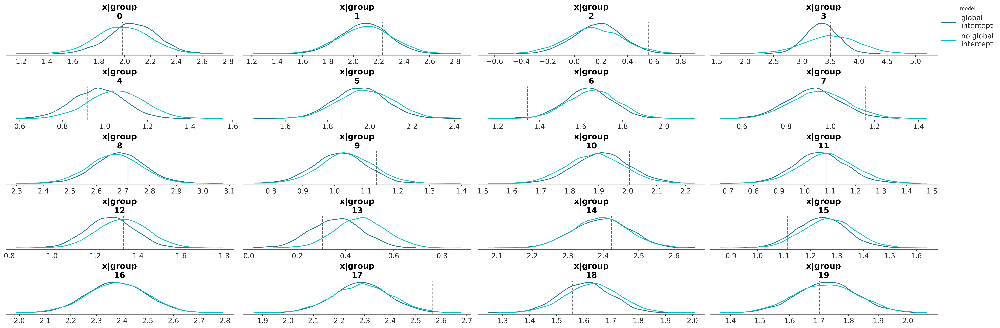

In [23]:
target_variable = "x|group"
pc = azp.plot_dist(
    {"global\nintercept": hierarchical_idata, "no global\nintercept": no_intercept_idata},
    var_names=target_variable,
    visuals={"point_estimate": False, "point_estimate_text": False, "credible_interval": False}
)
azp.add_lines(pc, true_params[[target_variable]])
pc.add_legend("model");

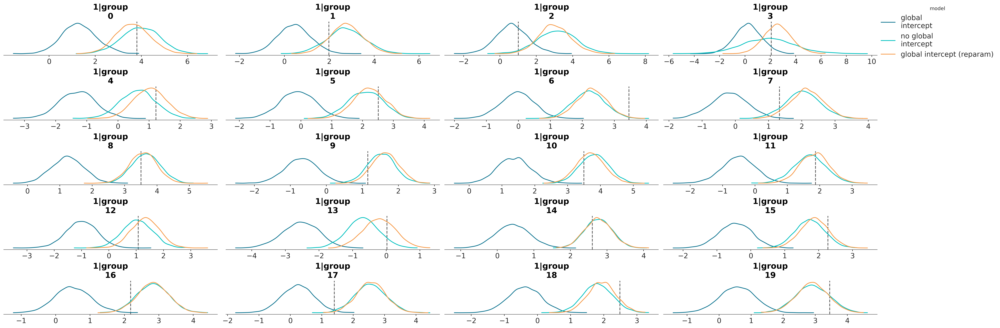

In [24]:
effective_intercept = hierarchical_idata.posterior["Intercept"] + hierarchical_idata.posterior["1|group"]
pc = azp.plot_dist(
    {"global\nintercept": hierarchical_idata, "no global\nintercept": no_intercept_idata, "global intercept (reparam)": effective_intercept.to_dataset(name="1|group")},
    var_names="1|group",
    visuals={"point_estimate": False, "point_estimate_text": False, "credible_interval": False}
)
azp.add_lines(pc, true_params[["1|group"]])
pc.add_legend("model");

## Model comparison

In [25]:
compare_df = azp.compare({"simple": simple_idata, "hierarchical": hierarchical_idata, "no_intercept": no_intercept_idata})
compare_df

,rank,elpd,p,elpd_diff,weight,se,dse,warning
hierarchical,0,-1679.124788,36.870443,0.000000,1.000000e+00,21.442348,0.000000,False
no_intercept,1,-1680.884964,39.861204,1.760176,0.000000e+00,21.297930,1.740665,False
simple,2,-2793.610691,3.778462,1114.485902,4.986120e-15,23.178758,28.768451,False


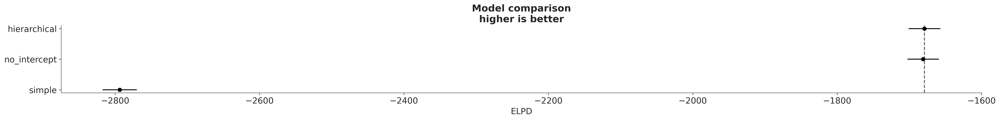

In [26]:
azp.plot_compare(compare_df);

## Multiple hierarchical regression for rent data


In [27]:
immo_df = pd.read_csv("berlin_rent.csv")

In [28]:
immo_df

,zip,rent,sqm_rent,living_space,offer_year,const_year,flattype,interior_qual
0,14109,1399.70,16.999028,82.34,2019,1920,apartment,sophisticated
1,13086,830.00,8.251317,100.59,2019,1912,ground_floor,normal
2,10785,3417.60,16.000000,213.60,2019,2018,penthouse,sophisticated
3,12057,490.00,10.000000,49.00,2019,1972,apartment,normal
4,13355,1150.00,17.024426,67.55,2019,2018,roof_storey,sophisticated
...,...,...,...,...,...,...,...,...
3565,13597,800.50,12.500000,64.04,2019,1900,apartment,sophisticated
3566,10115,2241.28,17.000000,131.84,2018,2013,apartment,luxury
3567,14199,645.00,14.021739,46.00,2019,1969,apartment,normal
3568,12559,579.00,9.650000,60.00,2019,1997,apartment,normal


In [29]:
immo_model = bmb.Model("rent ~ (living_space|zip)", immo_df)
immo_model

       Formula: rent ~ (living_space|zip)
        Family: gaussian
          Link: mu = identity
  Observations: 3570
        Priors: 
    target = mu
        Common-level effects
            Intercept ~ Normal(mu: 1268.2479, sigma: 2322.9454)
        
        Group-level effects
            1|zip ~ Normal(mu: 0.0, sigma: HalfNormal(sigma: 2322.9454))
            living_space|zip ~ Normal(mu: 0.0, sigma: HalfNormal(sigma: 50.6896))
        
        Auxiliary parameters
            sigma ~ HalfStudentT(nu: 4.0, sigma: 929.1782)

In [30]:
immo_idata = immo_model.fit(idata_kwargs={"log_likelihood": True, "log_prior": True})
immo_idata.extend(immo_model.prior_predictive(draws=2000))
immo_model.predict(immo_idata, kind="response")

Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [sigma, Intercept, 1|zip_sigma, 1|zip_offset, living_space|zip_sigma, living_space|zip_offset]


Output()

Sampling 4 chains for 1_000 tune and 1_000 draw iterations (4_000 + 4_000 draws total) took 20 seconds.
Sampling: [1|zip_offset, 1|zip_sigma, Intercept, living_space|zip_offset, living_space|zip_sigma, rent, sigma]


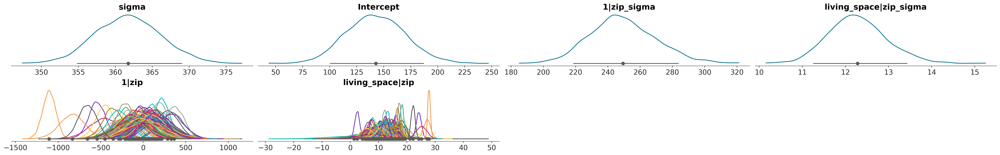

In [32]:
azp.plot_dist(
    immo_idata,
    var_names="~mu",
    cols=["__variable__"],
    aes={"color": ["zip__factor_dim"]},
    visuals={"point_estimate_text": False}
);

In [31]:
immo_prior_model = bmb.Model(
    "rent ~ (living_space|zip)",
    immo_df,
    priors={"living_space|zip": bmb.Prior("Gamma", mu=20, sigma=bmb.Prior("Normal", mu=15, sigma=2))},
    noncentered=False
)
immo_prior_model

       Formula: rent ~ (living_space|zip)
        Family: gaussian
          Link: mu = identity
  Observations: 3570
        Priors: 
    target = mu
        Common-level effects
            Intercept ~ Normal(mu: 1268.2479, sigma: 2322.9454)
        
        Group-level effects
            1|zip ~ Normal(mu: 0.0, sigma: HalfNormal(sigma: 2322.9454))
            living_space|zip ~ Gamma(mu: 20.0, sigma: Normal(mu: 15.0, sigma: 2.0))
        
        Auxiliary parameters
            sigma ~ HalfStudentT(nu: 4.0, sigma: 929.1782)

In [34]:
immo_prior_idata = immo_prior_model.fit(idata_kwargs={"log_likelihood": True, "log_prior": True}, target_accept=0.98, max_treedepth=11)
immo_prior_idata.extend(immo_prior_model.prior_predictive(draws=2000))
immo_prior_model.predict(immo_prior_idata, kind="response")

 Progress                    Draws   Divergences   Step size   Grad evals   Sampling Speed   Elapsed   Remaining  
 ───────────────────────────────────────────────────────────────────────────────────────────────────────────────── 
  ━━━━━━━━━━━━━━━━━━━━━━━━━   2000    0             0.051       127          39.45 draws/s    0:00:50   0:00:00    
  ━━━━━━━━━━━━━━━━━━━━━━━━━   2000    0             0.059       127          35.95 draws/s    0:00:55   0:00:00    
  ━━━━━━━━━━━━━━━━━━━━━━━━━   2000    0             0.053       127          35.37 draws/s    0:00:56   0:00:00    
  ━━━━━━━━━━━━━━━━━━━━━━━━━   2000    0             0.051       127          36.54 draws/s    0:00:54   0:00:00

Sampling 4 chains for 1_000 tune and 1_000 draw iterations (4_000 + 4_000 draws total) took 57 seconds.
Sampling: [1|zip, 1|zip_sigma, Intercept, living_space|zip, living_space|zip_sigma, rent, sigma]


In [34]:
prior = immo_prior_model.prior_predictive()

Sampling: [1|zip, 1|zip_sigma, Intercept, living_space|zip, living_space|zip_sigma, rent, sigma]


In [ ]:
azp.plot_dist(prior, group="prior", var_name="living_space|zip", cols=["__variable__"])

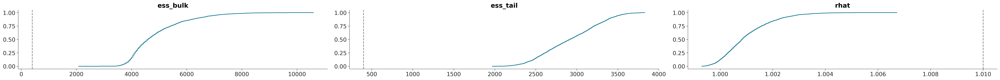

In [35]:
azp.plot_convergence_dist(immo_prior_idata);

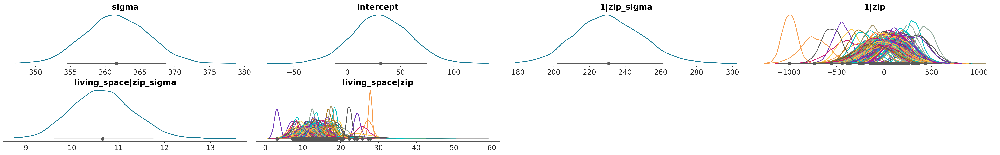

In [36]:
azp.plot_dist(
    immo_prior_idata,
    var_names="~mu",
    cols=["__variable__"],
    aes={"color": ["zip__factor_dim"]},
    visuals={"point_estimate_text": False}
);

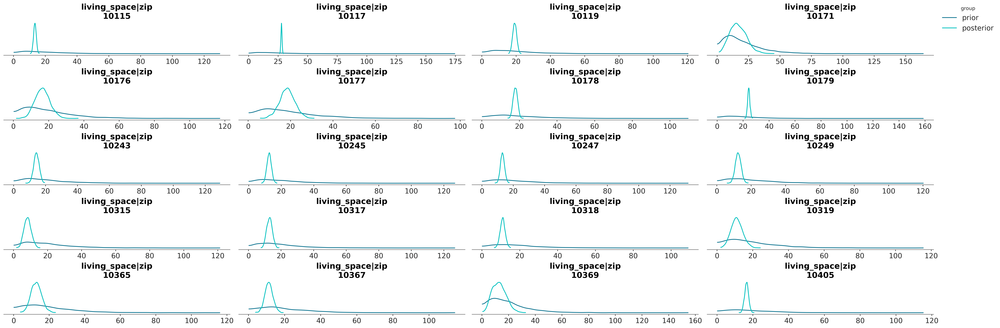

In [37]:
azp.plot_prior_posterior(immo_prior_idata, var_names="living_space|zip", coords={"zip__factor_dim": immo_idata.posterior.zip__factor_dim[:20]});

In [38]:
slopes_min = immo_idata.posterior["living_space|zip"].min(["chain", "draw"])
sorted_zips = immo_idata.posterior["zip__factor_dim"].sortby(slopes_min)
zips_to_plot = xr.concat((sorted_zips[:5], sorted_zips[-5:]), dim="zip__factor_dim")

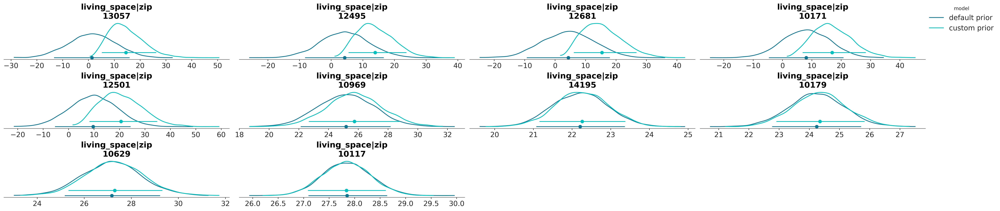

In [39]:
pc = azp.plot_dist(
    {"default prior": immo_idata, "custom prior": immo_prior_idata},
    var_names="living_space|zip",
    coords={"zip__factor_dim": zips_to_plot},
    cols=["__variable__", "zip__factor_dim"],
    visuals={"point_estimate_text": False}
)
pc.add_legend("model");

In [40]:
azp.psense_summary(immo_prior_idata, var_names="living_space|zip")

We detected potential issues. For more information on how to interpret the results, please check
https://arviz-devs.github.io/EABM/Chapters/Sensitivity_checks.html#interpreting-sensitivity-diagnostics-summary
or read original paper https://doi.org/10.1007/s11222-023-10366-5


,prior,likelihood,diagnosis
living_space|zip[10115],0.238,0.146,potential prior-data conflict
living_space|zip[10117],0.468,0.250,potential prior-data conflict
living_space|zip[10119],0.164,0.140,potential prior-data conflict
living_space|zip[10171],0.109,0.072,potential prior-data conflict
living_space|zip[10176],0.094,0.151,potential prior-data conflict
...,...,...,...
living_space|zip[14169],0.132,0.108,potential prior-data conflict
living_space|zip[14193],0.132,0.142,potential prior-data conflict
living_space|zip[14195],0.358,0.267,potential prior-data conflict
living_space|zip[14197],0.215,0.085,potential prior-data conflict


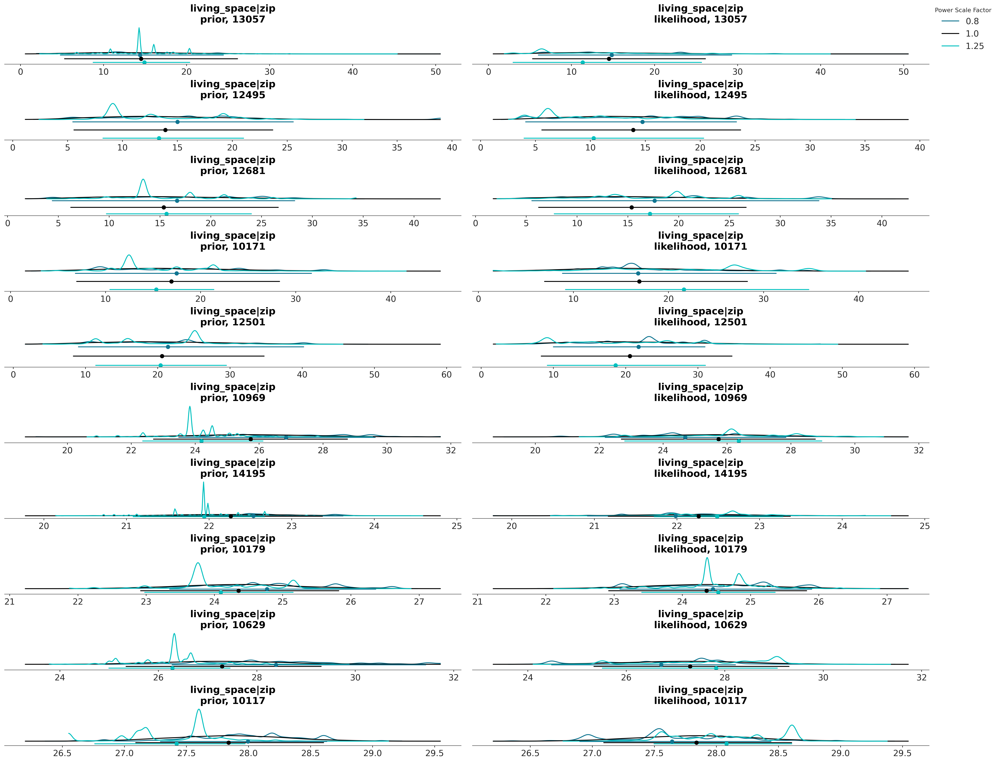

In [41]:
azp.plot_psense_dist(
    immo_prior_idata,
    var_names="living_space|zip",
    coords={"zip__factor_dim": zips_to_plot}
);

In [37]:
immo_model2 = bmb.Model("rent ~ (living_space|zip) + (living_space|flattype)", immo_df)
immo_idata2 = immo_model2.fit()

Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [sigma, Intercept, 1|zip_sigma, 1|zip_offset, living_space|zip_sigma, living_space|zip_offset, 1|flattype_sigma, 1|flattype_offset, living_space|flattype_sigma, living_space|flattype_offset]


Output()

Sampling 4 chains for 1_000 tune and 1_000 draw iterations (4_000 + 4_000 draws total) took 64 seconds.
There were 949 divergences after tuning. Increase `target_accept` or reparameterize.
The rhat statistic is larger than 1.01 for some parameters. This indicates problems during sampling. See https://arxiv.org/abs/1903.08008 for details
The effective sample size per chain is smaller than 100 for some parameters.  A higher number is needed for reliable rhat and ess computation. See https://arxiv.org/abs/1903.08008 for details
